In [3]:
%matplotlib inline
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import IPython.display as ipyd
from libs import gif, nb_utils

인터액티브 세션 시작하기:

In [4]:
sess = tf.InteractiveSession()

구글의 inception model을 불러오기

In [5]:
from libs import inception
net = inception.get_inception_model()

graph을 import하기

In [6]:
tf.import_graph_def(net['graph_def'], name='inception')

라벨을 살펴보기

In [7]:
net['labels']

[(0, 'dummy'),
 (1, 'kit fox'),
 (2, 'English setter'),
 (3, 'Siberian husky'),
 (4, 'Australian terrier'),
 (5, 'English springer'),
 (6, 'grey whale'),
 (7, 'lesser panda'),
 (8, 'Egyptian cat'),
 (9, 'ibex'),
 (10, 'Persian cat'),
 (11, 'cougar'),
 (12, 'gazelle'),
 (13, 'porcupine'),
 (14, 'sea lion'),
 (15, 'malamute'),
 (16, 'badger'),
 (17, 'Great Dane'),
 (18, 'Walker hound'),
 (19, 'Welsh springer spaniel'),
 (20, 'whippet'),
 (21, 'Scottish deerhound'),
 (22, 'killer whale'),
 (23, 'mink'),
 (24, 'African elephant'),
 (25, 'Weimaraner'),
 (26, 'soft-coated wheaten terrier'),
 (27, 'Dandie Dinmont'),
 (28, 'red wolf'),
 (29, 'Old English sheepdog'),
 (30, 'jaguar'),
 (31, 'otterhound'),
 (32, 'bloodhound'),
 (33, 'Airedale'),
 (34, 'hyena'),
 (35, 'meerkat'),
 (36, 'giant schnauzer'),
 (37, 'titi'),
 (38, 'three-toed sloth'),
 (39, 'sorrel'),
 (40, 'black-footed ferret'),
 (41, 'dalmatian'),
 (42, 'black-and-tan coonhound'),
 (43, 'papillon'),
 (44, 'skunk'),
 (45, 'Staffordsh

그래프의 내부의 연산들을 살펴보기

In [8]:
g = tf.get_default_graph()
names = [op.name for op in g.get_operations()]
print(names)

['inception/input', 'inception/conv2d0_w', 'inception/conv2d0_b', 'inception/conv2d1_w', 'inception/conv2d1_b', 'inception/conv2d2_w', 'inception/conv2d2_b', 'inception/mixed3a_1x1_w', 'inception/mixed3a_1x1_b', 'inception/mixed3a_3x3_bottleneck_w', 'inception/mixed3a_3x3_bottleneck_b', 'inception/mixed3a_3x3_w', 'inception/mixed3a_3x3_b', 'inception/mixed3a_5x5_bottleneck_w', 'inception/mixed3a_5x5_bottleneck_b', 'inception/mixed3a_5x5_w', 'inception/mixed3a_5x5_b', 'inception/mixed3a_pool_reduce_w', 'inception/mixed3a_pool_reduce_b', 'inception/mixed3b_1x1_w', 'inception/mixed3b_1x1_b', 'inception/mixed3b_3x3_bottleneck_w', 'inception/mixed3b_3x3_bottleneck_b', 'inception/mixed3b_3x3_w', 'inception/mixed3b_3x3_b', 'inception/mixed3b_5x5_bottleneck_w', 'inception/mixed3b_5x5_bottleneck_b', 'inception/mixed3b_5x5_w', 'inception/mixed3b_5x5_b', 'inception/mixed3b_pool_reduce_w', 'inception/mixed3b_pool_reduce_b', 'inception/mixed4a_1x1_w', 'inception/mixed4a_1x1_b', 'inception/mixed4a_3

그래프의 입력은 첫번째 텐서의 출력에 있다.

In [9]:
input_name = names[0] + ':0'
x = g.get_tensor_by_name(input_name)

1000개의 클래스의 확률은 마지막 레이어의 output에 있다.

In [10]:
softmax = g.get_tensor_by_name(names[-1] + ':0')

<a name="predicting-with-the-inception-network"></a>
## Inception Model로 예측하기



0 255


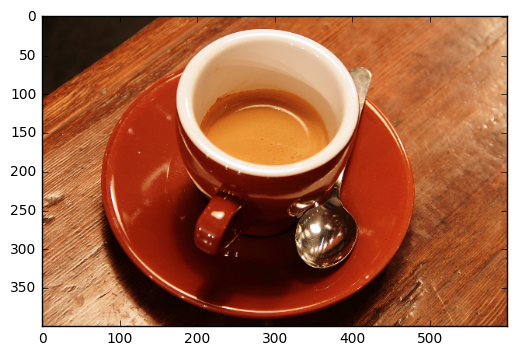

In [11]:
from skimage.data import coffee
og = coffee()
plt.imshow(og)
print(og.min(), og.max())

영상을 299 x 299 사이즈로 바꾼다. preprocess함수가 사이즈를 바꿔주고, 
모든 픽셀로부터 평균값을 뺀다.

In [12]:
img = inception.preprocess(og)
print(og.shape), print(img.shape)

(400, 600, 3)
(299, 299, 3)


(None, None)

In [13]:
#영상의 최소값과 최대값을 출력하기
print(img.min(), img.max())

-117.0 138.0


텐서플로우 함수에서 사용하려면 영상이 4차원이 되어야 ㅎㄴ다. 
즉, 영상의 갯수, 높이, 넓이, 채널의 수를 가져야 한다. 
이를 위해 0번 축에 새로운 축을 추가한다.

In [14]:
img_4d = img[np.newaxis]
print(img_4d.shape)

(1, 299, 299, 3)


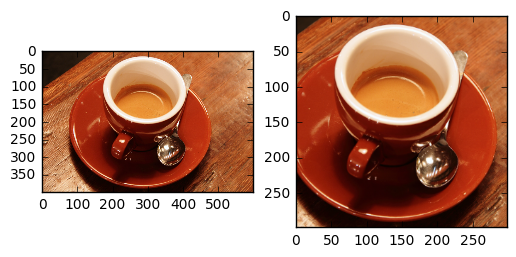

In [15]:
fig, axs = plt.subplots(1, 2)
axs[0].imshow(og)

# 영상을 보려면 deprocess를 호출해야 평균값을 다시 더해서 영상으로 볼 수 있다
axs[1].imshow(inception.deprocess(img))

In [16]:
res = np.squeeze(softmax.eval(feed_dict={x: img_4d}))

In [1]:
# 1008개의 확률값을 내는 16개의 output이 있다.
# 여기서 처음의 1000개의 확률값만 쓰자.
res.shape

NameError: name 'res' is not defined

결과는 1000개의 출력을 내고 있다. (정확하게는 1008)

In [17]:
# Note that this is one way to aggregate the different probabilities.  We could also
# take the argmax.
res = np.mean(res, 0) #16개에 대한 평균을 낸다. 
res = res / np.sum(res) # 크기를 normalize하여 0~1사이의 값을 가지게 한다. 

In [18]:
print([(res[idx], net['labels'][idx])
       for idx in res.argsort()[-5:][::-1]]) # res에 대하여 정렬을 해서 값이 가장 큰 5개를 출력

[(0.99849206, (947, 'espresso')), (0.00063125527, (859, 'cup')), (0.00050241518, (953, 'chocolate sauce')), (0.00019483241, (844, 'consomme')), (0.00013370359, (822, 'soup bowl'))]


In [19]:
def normalize(img, s=0.1):
    '''Normalize the image range for visualization'''
    z = img / np.std(img)
    return np.uint8(np.clip(
        (z - z.mean()) / max(z.std(), 1e-4) * s + 0.5,
        0, 1) * 255)


<a name="deep-dreaming"></a>
# Deep Dreaming


0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

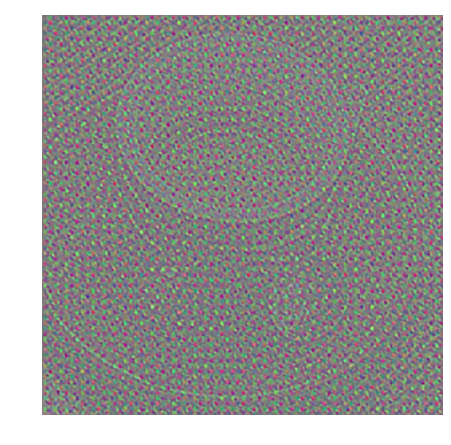

In [20]:
# 0-1 범위로 scaling하기
img_4d = img_4d / np.max(img_4d)

# max pool layer얻기
layer = g.get_tensor_by_name('inception/maxpool0:0')

# 레이어의 평균 activation의 입력영상에 대한 gradient계산하기
gradient = tf.gradients(tf.reduce_mean(layer), x)

# 입력영상에 대한 Copy본 만들기 (뒤에서 반복문으로 gradient영상을 더하기 때문에)
img_copy = img_4d.copy()

# 50 iterations 돌리기
n_iterations = 50

# gradient를 입력영상에 얼만큼 더할 것인지 
step = 1.0

# iteration 10번마다 GIT영상 만들기 
gif_step = 10

# GIF영상 저장하기
imgs = []
for it_i in range(n_iterations):
    print(it_i, end=', ')

    # 입력영상에 대한 gradient를 계산한다.
    this_res = sess.run(gradient[0], feed_dict={x: img_copy})[0]

    # maximum activation에 대해 normalize시키기
    this_res /= (np.max(np.abs(this_res)) + 1e-8)

    # 그리고 나서 입력영상에 더하기
    img_copy += this_res * step

    # gif에 붙이기
    if it_i % gif_step == 0:
        imgs.append(normalize(img_copy[0]))

# gif영상 만들기
gif.build_gif(imgs, saveto='1-simplest-mean-layer.gif')

In [21]:
ipyd.Image(url='1-simplest-mean-layer.gif', height=200, width=200)

Activation이 영상의 edge등에서 일어나고 있는 것을 볼 수 있다. 
전체 레이어에 대한 평균을 구하는 것보다, 최대값을 출력하는 노드의 평균적인 activation을 계산할 수도 있다. 

In [22]:
# Find the maximal neuron in a layer 레이어에서 최대값을 내는 neuron을 찾기
neuron = tf.reduce_max(layer, len(layer.get_shape())-1)
# Then find the mean over this neuron
gradient = tf.gradients(tf.reduce_mean(neuron), x)

나머지 부분은 앞과 같음:

0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

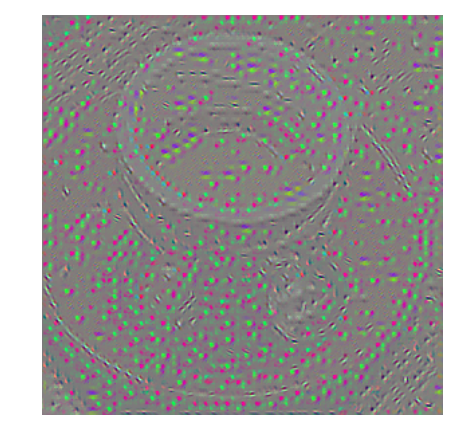

In [23]:
img_copy = img_4d.copy()
imgs = []
for it_i in range(n_iterations):
    print(it_i, end=', ')
    this_res = sess.run(gradient[0], feed_dict={x: img_copy})[0]
    this_res /= (np.max(np.abs(this_res)) + 1e-8)
    img_copy += this_res * step
    if it_i % gif_step == 0:
        imgs.append(normalize(img_copy[0]))
gif.build_gif(imgs, saveto='1-simplest-max-neuron.gif')

In [25]:
ipyd.Image(url='1-simplest-max-neuron.gif', height=200, width=200)

다른 레이어들에 대해서도 수행하기

In [26]:
features = [name for name in names if 'maxpool' in name.split()[-1]]
print(features)

['inception/maxpool0', 'inception/maxpool1', 'inception/maxpool4', 'inception/maxpool10']


0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 

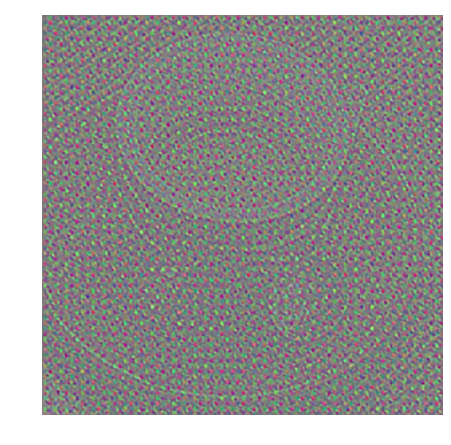

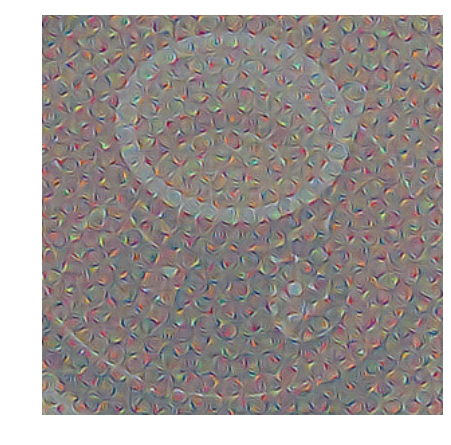

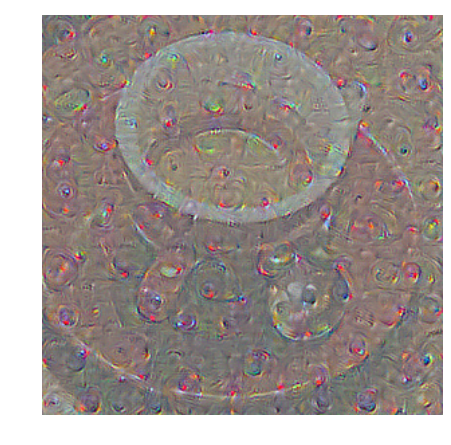

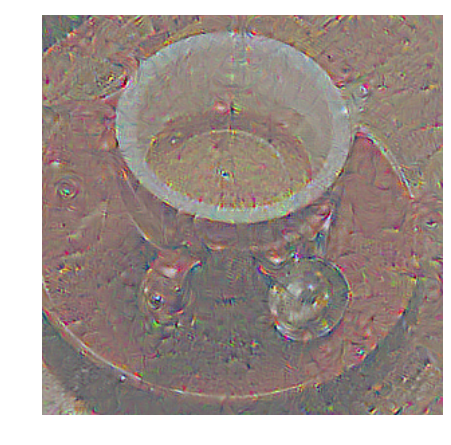

In [27]:
# For each max pooling feature, we'll produce a GIF
for feature_i in features:
    layer = g.get_tensor_by_name(feature_i + ':0')
    gradient = tf.gradients(tf.reduce_mean(layer), x)
    img_copy = img_4d.copy()
    imgs = []
    for it_i in range(n_iterations):
        print(it_i, end=', ')
        this_res = sess.run(gradient[0], feed_dict={x: img_copy})[0]
        this_res /= (np.max(np.abs(this_res)) + 1e-8)
        img_copy += this_res * step
        if it_i % gif_step == 0:
            imgs.append(normalize(img_copy[0]))
    gif.build_gif(
        imgs, saveto='1-simplest-' + feature_i.split('/')[-1] + '.gif')

출력결과를 보면 각 노드가 대표하는 특징이 영상에 나타나는 것을 확인할 수 있다.


<a name="style-net"></a>
# Style Net

이 부분은 Style Net에 대한 부분입니다. 

<a name="vgg-network"></a>
## VGG Network

이번에는 VGG 네트워크를 로딩합니다.:

In [28]:
import tensorflow as tf
from libs import utils

In [29]:
from tensorflow.python.framework.ops import reset_default_graph
sess.close()
reset_default_graph()

이번에는 그래프를 생성하고, 세션에 이 그래프를 사용함을 알려줌. 

In [31]:
from libs import vgg16
net = vgg16.get_vgg_model()

URLError: <urlopen error [Errno -2] Name or service not known>

다음은 CPU를 사용해서 세션을 여는 부분임.

In [7]:
g = tf.Graph()
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    tf.import_graph_def(net['graph_def'], name='vgg')
    names = [op.name for op in g.get_operations()]

네트워크 내부 살펴보기

In [8]:
nb_utils.show_graph(net['graph_def'])

In [9]:
print(names)

['vgg/images', 'vgg/mul/y', 'vgg/mul', 'vgg/split/split_dim', 'vgg/split', 'vgg/sub/y', 'vgg/sub', 'vgg/sub_1/y', 'vgg/sub_1', 'vgg/sub_2/y', 'vgg/sub_2', 'vgg/concat/concat_dim', 'vgg/concat', 'vgg/conv1_1/filter', 'vgg/conv1_1/Conv2D', 'vgg/conv1_1/biases', 'vgg/conv1_1/BiasAdd', 'vgg/conv1_1/conv1_1', 'vgg/conv1_2/filter', 'vgg/conv1_2/Conv2D', 'vgg/conv1_2/biases', 'vgg/conv1_2/BiasAdd', 'vgg/conv1_2/conv1_2', 'vgg/pool1', 'vgg/conv2_1/filter', 'vgg/conv2_1/Conv2D', 'vgg/conv2_1/biases', 'vgg/conv2_1/BiasAdd', 'vgg/conv2_1/conv2_1', 'vgg/conv2_2/filter', 'vgg/conv2_2/Conv2D', 'vgg/conv2_2/biases', 'vgg/conv2_2/BiasAdd', 'vgg/conv2_2/conv2_2', 'vgg/pool2', 'vgg/conv3_1/filter', 'vgg/conv3_1/Conv2D', 'vgg/conv3_1/biases', 'vgg/conv3_1/BiasAdd', 'vgg/conv3_1/conv3_1', 'vgg/conv3_2/filter', 'vgg/conv3_2/Conv2D', 'vgg/conv3_2/biases', 'vgg/conv3_2/BiasAdd', 'vgg/conv3_2/conv3_2', 'vgg/conv3_3/filter', 'vgg/conv3_3/Conv2D', 'vgg/conv3_3/biases', 'vgg/conv3_3/BiasAdd', 'vgg/conv3_3/conv3_

입력과 출력을 얻기

In [10]:
x = g.get_tensor_by_name(names[0] + ':0')
softmax = g.get_tensor_by_name(names[-2] + ':0')

영상전처리하기

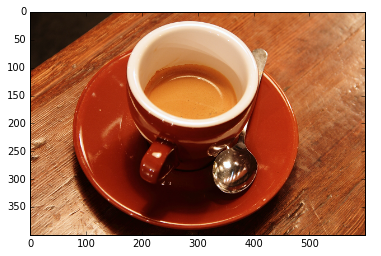

In [11]:
from skimage.data import coffee
og = coffee()
plt.imshow(og)

In [12]:
img = vgg16.preprocess(og)

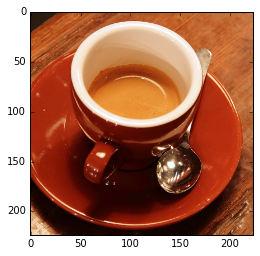

In [13]:
plt.imshow(vgg16.deprocess(img))

In [14]:
img_4d = img[np.newaxis]

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = softmax.eval(feed_dict={x: img_4d})[0]
    print([(res[idx], net['labels'][idx])
           for idx in res.argsort()[-5:][::-1]])

[(0.99072862, (967, 'n07920052 espresso')), (0.0038241001, (968, 'n07930864 cup')), (0.0016883078, (868, 'n04476259 tray')), (0.0012987712, (960, 'n07836838 chocolate sauce, chocolate syrup')), (0.0011314416, (925, 'n07584110 consomme'))]


<a name="dropout"></a>
## Dropout

다시 돌려보면 다른 결과가 나오게 됨.:

In [15]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = softmax.eval(feed_dict={x: img_4d})[0]
print([(res[idx], net['labels'][idx])
       for idx in res.argsort()[-5:][::-1]])

[(0.88728428, (967, 'n07920052 espresso')), (0.077477559, (968, 'n07930864 cup')), (0.018839369, (960, 'n07836838 chocolate sauce, chocolate syrup')), (0.006374768, (925, 'n07584110 consomme')), (0.0063688005, (504, 'n03063599 coffee mug'))]


이것은 dropout을 사용하고 있기 때문이다.

In [16]:
[name_i for name_i in names if 'dropout' in name_i]

['vgg/dropout/Shape',
 'vgg/dropout/random_uniform/min',
 'vgg/dropout/random_uniform/range',
 'vgg/dropout/random_uniform/RandomUniform',
 'vgg/dropout/random_uniform/mul',
 'vgg/dropout/random_uniform',
 'vgg/dropout/add/x',
 'vgg/dropout/add',
 'vgg/dropout/Floor',
 'vgg/dropout/mul/y',
 'vgg/dropout/mul',
 'vgg/dropout/mul_1',
 'vgg/dropout_1/Shape',
 'vgg/dropout_1/random_uniform/min',
 'vgg/dropout_1/random_uniform/range',
 'vgg/dropout_1/random_uniform/RandomUniform',
 'vgg/dropout_1/random_uniform/mul',
 'vgg/dropout_1/random_uniform',
 'vgg/dropout_1/add/x',
 'vgg/dropout_1/add',
 'vgg/dropout_1/Floor',
 'vgg/dropout_1/mul/y',
 'vgg/dropout_1/mul',
 'vgg/dropout_1/mul_1']

2개의 drop out레이어가 있는데, `feed_dict` parameter값을 1로 놓음으로써 drop out하지 않도록 함.

In [17]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = softmax.eval(feed_dict={
        x: img_4d,
        'vgg/dropout_1/random_uniform:0': [[1.0]],
        'vgg/dropout/random_uniform:0': [[1.0]]})[0]
print([(res[idx], net['labels'][idx])
       for idx in res.argsort()[-5:][::-1]])

[(0.99999619, (967, 'n07920052 espresso')), (3.8687845e-06, (968, 'n07930864 cup')), (5.4153543e-10, (504, 'n03063599 coffee mug')), (3.8140457e-10, (960, 'n07836838 chocolate sauce, chocolate syrup')), (3.2201272e-10, (925, 'n07584110 consomme'))]


drop out사용 안 하는 것을 확인함.

In [18]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = softmax.eval(feed_dict={
        x: img_4d,
        'vgg/dropout_1/random_uniform:0': [[1.0]],
        'vgg/dropout/random_uniform:0': [[1.0]]})[0]
print([(res[idx], net['labels'][idx])
       for idx in res.argsort()[-5:][::-1]])

[(0.99999619, (967, 'n07920052 espresso')), (3.8687845e-06, (968, 'n07930864 cup')), (5.4153543e-10, (504, 'n03063599 coffee mug')), (3.8140457e-10, (960, 'n07836838 chocolate sauce, chocolate syrup')), (3.2201272e-10, (925, 'n07584110 consomme'))]


In [19]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    content_layer = 'vgg/conv4_2/conv4_2:0'
    content_features = g.get_tensor_by_name(content_layer).eval(
            session=sess,
            feed_dict={x: img_4d,
                'vgg/dropout_1/random_uniform:0': [[1.0]],
                'vgg/dropout/random_uniform:0': [[1.0]]
            })
print(content_features.shape)

(1, 28, 28, 512)



## 스타일 영상 다운로드

다음은 보쉬의 그림을 다운로드함.

In [20]:
filepath = utils.download('https://upload.wikimedia.org/wikipedia/commons/thumb/a/ae/El_jard%C3%ADn_de_las_Delicias%2C_de_El_Bosco.jpg/640px-El_jard%C3%ADn_de_las_Delicias%2C_de_El_Bosco.jpg')

In [2]:
#영상 읽기를 하면서 약간 잘라냄.
style_og = plt.imread(filepath)[15:-15, 190:-190, :]
plt.imshow(style_og)

NameError: name 'plt' is not defined

VGG에 들어가기 전에 전처리함.

In [22]:
style_img = vgg16.preprocess(style_og)
style_img_4d = style_img[np.newaxis]

VGG가 이 영상을 어떻게 생각하는지 확인

In [23]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    res = softmax.eval(
        feed_dict={
            x: style_img_4d,
            'vgg/dropout_1/random_uniform:0': [[1.0]],
            'vgg/dropout/random_uniform:0': [[1.0]]})[0]
print([(res[idx], net['labels'][idx])
       for idx in res.argsort()[-5:][::-1]])

[(0.99336135, (611, 'n03598930 jigsaw puzzle')), (0.0052440548, (868, 'n04476259 tray')), (0.0011667105, (591, 'n03485794 handkerchief, hankie, hanky, hankey')), (0.00011143424, (865, 'n04462240 toyshop')), (4.7309215e-05, (917, 'n06596364 comic book'))]


jigsaw puzzle로 결과가 나옴. 각각 다른 레이어들에서 이 영상의 feature를 찾아보기

In [24]:
style_layers = ['vgg/conv1_1/conv1_1:0',
                'vgg/conv2_1/conv2_1:0',
                'vgg/conv3_1/conv3_1:0',
                'vgg/conv4_1/conv4_1:0',
                'vgg/conv5_1/conv5_1:0']
style_activations = []

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    for style_i in style_layers:
        style_activation_i = g.get_tensor_by_name(style_i).eval(
            feed_dict={
                x: style_img_4d,
                'vgg/dropout_1/random_uniform:0': [[1.0]],
                'vgg/dropout/random_uniform:0': [[1.0]]})
        style_activations.append(style_activation_i)

Gram Matrix를 만들기

In [25]:
style_features = []
for style_activation_i in style_activations:
    s_i = np.reshape(style_activation_i, [-1, style_activation_i.shape[-1]])
    gram_matrix = np.matmul(s_i.T, s_i) / s_i.size
    style_features.append(gram_matrix.astype(np.float32))

<a name="remapping-the-input"></a>
## Remapping the Input

새로운 그래프를 만들고, 디폴트 그래프로 놓기

In [26]:
reset_default_graph()
g = tf.Graph()

이 네트워크에 영상을 넣는데, 우리가 주는 영상을 initial로 해서 준다. 그런데 이 영상은 Variable type이다. 영상이 계속 변하기 때문이다.

In [27]:
net = vgg16.get_vgg_model()
# net_input = tf.get_variable(
#    name='input',
#    shape=(1, 224, 224, 3),
#    dtype=tf.float32,
#    initializer=tf.random_normal_initializer(
#        mean=np.mean(img), stddev=np.std(img)))
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    net_input = tf.Variable(img_4d)
    tf.import_graph_def(
        net['graph_def'],
        name='vgg',
        input_map={'images:0': net_input})

그래프를 살펴보기

In [28]:
names = [op.name for op in g.get_operations()]
print(names)

['Variable/initial_value', 'Variable', 'Variable/Assign', 'Variable/read', 'vgg/images', 'vgg/mul/y', 'vgg/mul', 'vgg/split/split_dim', 'vgg/split', 'vgg/sub/y', 'vgg/sub', 'vgg/sub_1/y', 'vgg/sub_1', 'vgg/sub_2/y', 'vgg/sub_2', 'vgg/concat/concat_dim', 'vgg/concat', 'vgg/conv1_1/filter', 'vgg/conv1_1/Conv2D', 'vgg/conv1_1/biases', 'vgg/conv1_1/BiasAdd', 'vgg/conv1_1/conv1_1', 'vgg/conv1_2/filter', 'vgg/conv1_2/Conv2D', 'vgg/conv1_2/biases', 'vgg/conv1_2/BiasAdd', 'vgg/conv1_2/conv1_2', 'vgg/pool1', 'vgg/conv2_1/filter', 'vgg/conv2_1/Conv2D', 'vgg/conv2_1/biases', 'vgg/conv2_1/BiasAdd', 'vgg/conv2_1/conv2_1', 'vgg/conv2_2/filter', 'vgg/conv2_2/Conv2D', 'vgg/conv2_2/biases', 'vgg/conv2_2/BiasAdd', 'vgg/conv2_2/conv2_2', 'vgg/pool2', 'vgg/conv3_1/filter', 'vgg/conv3_1/Conv2D', 'vgg/conv3_1/biases', 'vgg/conv3_1/BiasAdd', 'vgg/conv3_1/conv3_1', 'vgg/conv3_2/filter', 'vgg/conv3_2/Conv2D', 'vgg/conv3_2/biases', 'vgg/conv3_2/BiasAdd', 'vgg/conv3_2/conv3_2', 'vgg/conv3_3/filter', 'vgg/conv3_3

입력이 영상으로 초기화된 것을 확인함. 

## Content Loss정의하기

이제 Content Loss를 정의하기:

In [29]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    content_loss = tf.nn.l2_loss((g.get_tensor_by_name(content_layer) -
                                 content_features) /
                                 content_features.size)

<a name="defining-the-style-loss"></a>
## Style Loss 정의하기

Style loss를 위해서는 gram matrix를 계산한다. 

In [30]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    style_loss = np.float32(0.0)
    for style_layer_i, style_gram_i in zip(style_layers, style_features):
        layer_i = g.get_tensor_by_name(style_layer_i)
        layer_shape = layer_i.get_shape().as_list()
        layer_size = layer_shape[1] * layer_shape[2] * layer_shape[3]
        layer_flat = tf.reshape(layer_i, [-1, layer_shape[3]])
        gram_matrix = tf.matmul(tf.transpose(layer_flat), layer_flat) / layer_size
        style_loss = tf.add(style_loss, tf.nn.l2_loss((gram_matrix - style_gram_i) / np.float32(style_gram_i.size)))

## Total variation Loss를 정의하기

이웃 화소간에 비슷해지게 만든다. 

In [31]:
def total_variation_loss(x):
    h, w = x.get_shape().as_list()[1], x.get_shape().as_list()[1]
    dx = tf.square(x[:, :h-1, :w-1, :] - x[:, :h-1, 1:, :])
    dy = tf.square(x[:, :h-1, :w-1, :] - x[:, 1:, :w-1, :])
    return tf.reduce_sum(tf.pow(dx + dy, 1.25))

with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    tv_loss = total_variation_loss(net_input)

## 학습하기

Content Loss, Style Loss, Total Variation Loss를 합쳐서 최소화함으로써 Style transfer가 되게 함.

In [32]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    loss = 0.1 * content_loss + 5.0 * style_loss + 0.01 * tv_loss
    optimizer = tf.train.AdamOptimizer(0.01).minimize(loss)

0: 47.247391, (-0.010000 - 1.010000)


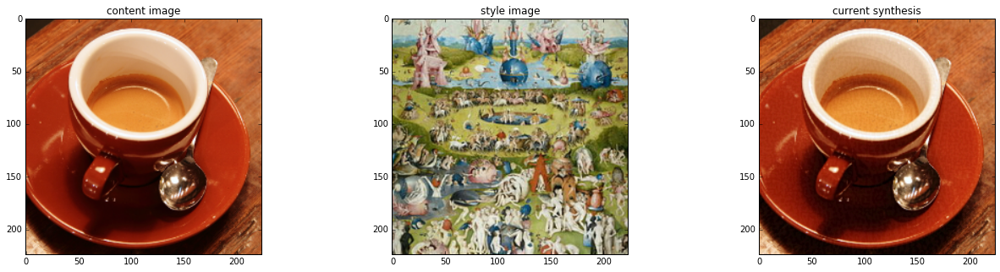

1: 41.527805, (-0.019984 - 1.020013)
2: 36.726242, (-0.029970 - 1.030036)
3: 33.132301, (-0.039943 - 1.040036)
4: 30.825277, (-0.049814 - 1.049982)
5: 29.472797, (-0.059614 - 1.059739)


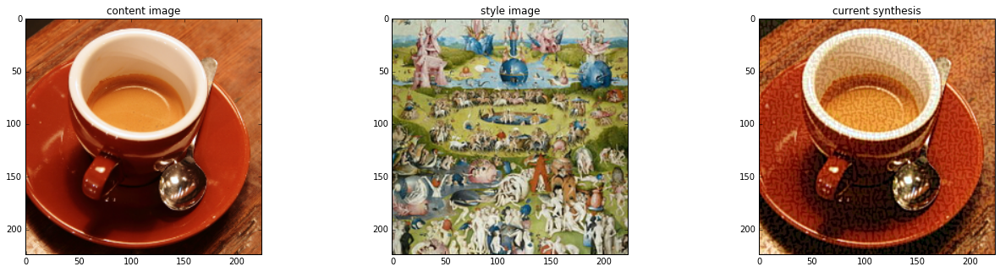

6: 28.482155, (-0.069084 - 1.069270)
7: 27.398533, (-0.078122 - 1.078805)
8: 26.078959, (-0.086861 - 1.088219)
9: 24.599209, (-0.096156 - 1.097538)
10: 23.106552, (-0.104688 - 1.106785)


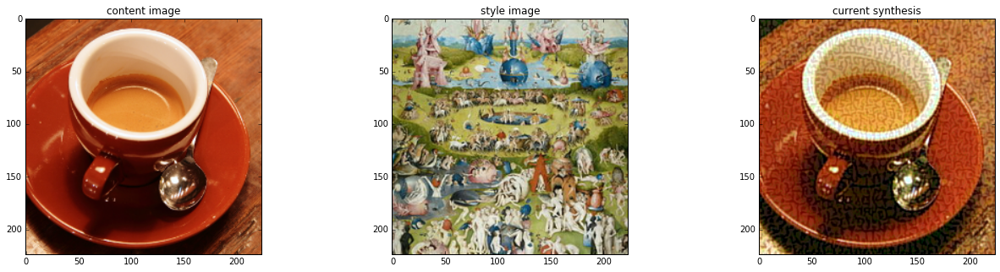

11: 21.728117, (-0.112565 - 1.116050)
12: 20.532927, (-0.121970 - 1.125387)
13: 19.527969, (-0.132242 - 1.134813)
14: 18.680058, (-0.142458 - 1.144342)
15: 17.944118, (-0.152462 - 1.153988)


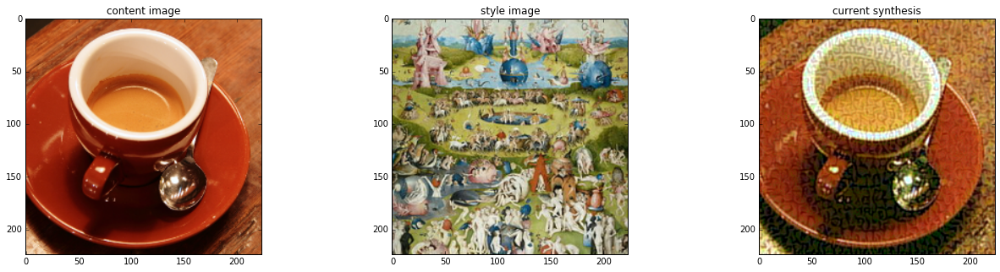

16: 17.281269, (-0.162253 - 1.163744)
17: 16.672457, (-0.171585 - 1.173564)
18: 16.113823, (-0.179913 - 1.183393)
19: 15.612597, (-0.186531 - 1.193166)
20: 15.175312, (-0.190814 - 1.202783)


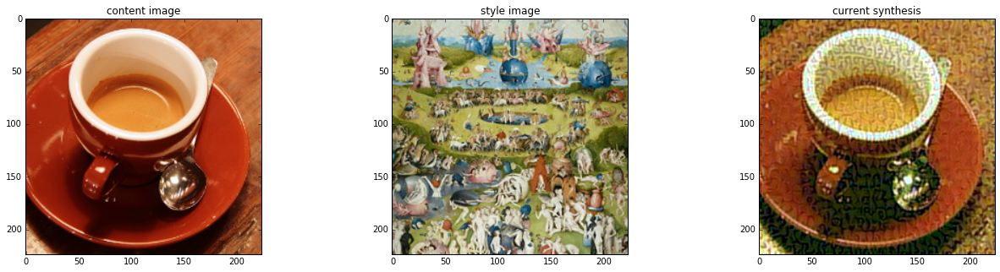

21: 14.799221, (-0.193791 - 1.212068)
22: 14.471707, (-0.202589 - 1.220960)
23: 14.174005, (-0.210879 - 1.229360)
24: 13.889018, (-0.218521 - 1.237175)
25: 13.608907, (-0.225438 - 1.244390)


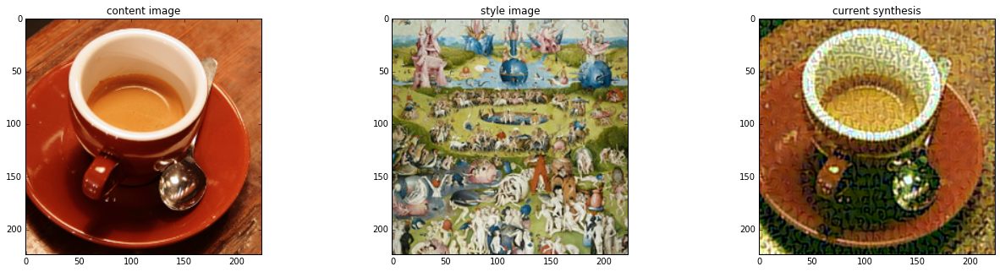

26: 13.335546, (-0.231610 - 1.251005)
27: 13.076498, (-0.237120 - 1.257057)
28: 12.839410, (-0.242065 - 1.262578)
29: 12.627560, (-0.246453 - 1.267609)
30: 12.438450, (-0.250359 - 1.272232)


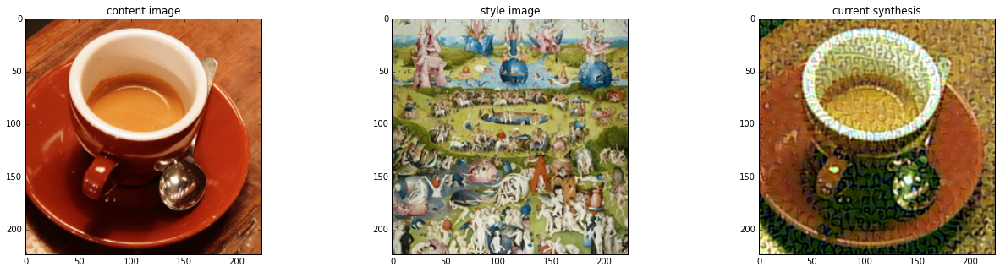

31: 12.266417, (-0.253853 - 1.276482)
32: 12.105091, (-0.256894 - 1.280326)
33: 11.950727, (-0.264070 - 1.283617)
34: 11.802845, (-0.273506 - 1.286333)
35: 11.663670, (-0.282830 - 1.291337)


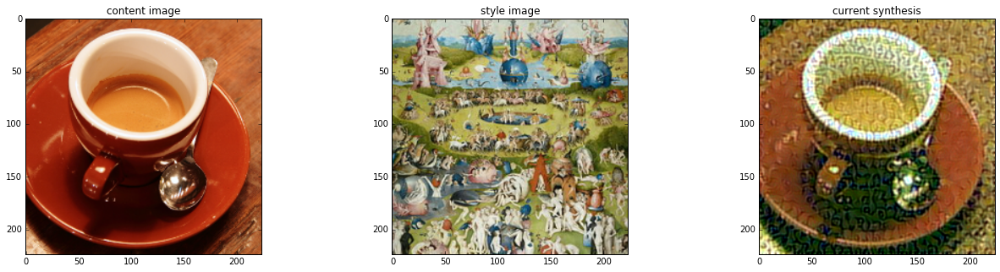

36: 11.535501, (-0.291971 - 1.297106)
37: 11.419305, (-0.300841 - 1.302230)
38: 11.313501, (-0.309364 - 1.306639)
39: 11.214956, (-0.317482 - 1.310291)
40: 11.120373, (-0.325157 - 1.313208)


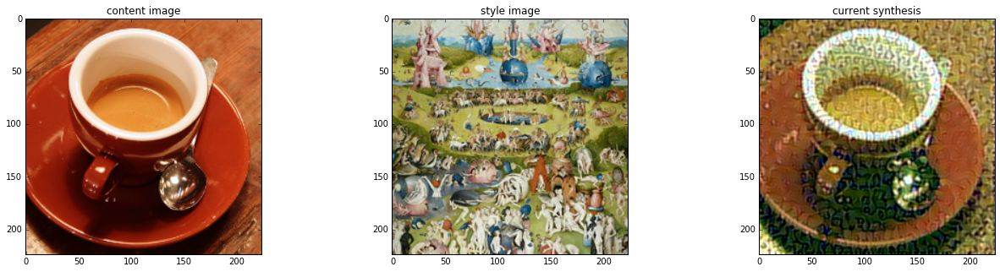

41: 11.028181, (-0.332392 - 1.315448)
42: 10.938995, (-0.339203 - 1.317093)
43: 10.854811, (-0.345624 - 1.318280)
44: 10.776907, (-0.351696 - 1.319143)
45: 10.705124, (-0.357446 - 1.319765)


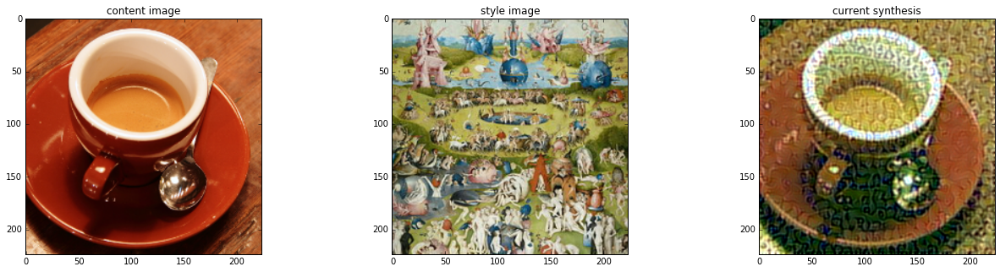

46: 10.638214, (-0.362892 - 1.320251)
47: 10.574605, (-0.368022 - 1.320665)
48: 10.513269, (-0.372818 - 1.321053)
49: 10.454495, (-0.377236 - 1.321387)
50: 10.398926, (-0.381224 - 1.321625)


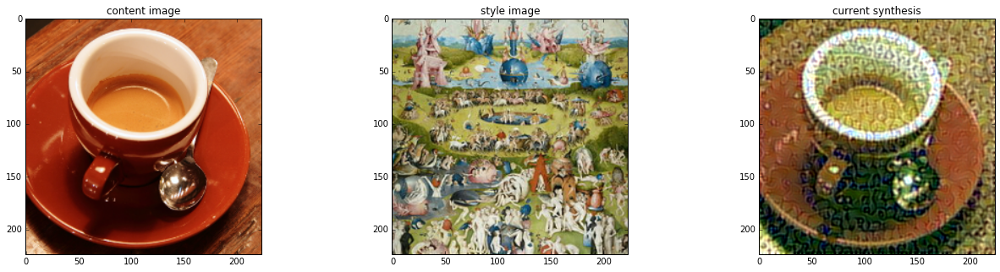

51: 10.346942, (-0.384715 - 1.322742)
52: 10.298336, (-0.387667 - 1.327233)
53: 10.252294, (-0.390061 - 1.331752)
54: 10.207791, (-0.391895 - 1.339223)
55: 10.164473, (-0.393215 - 1.346594)


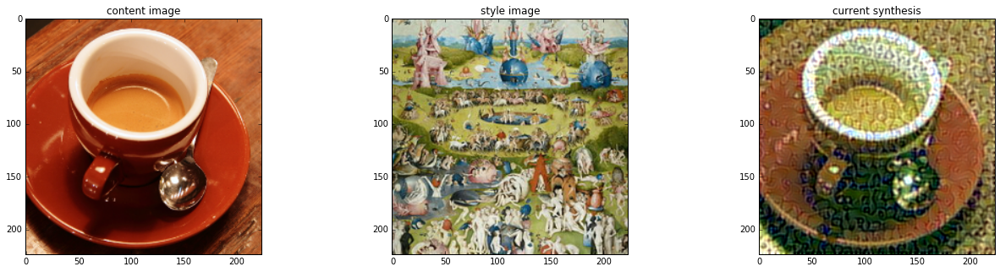

56: 10.122510, (-0.394063 - 1.353848)
57: 10.082338, (-0.394505 - 1.361039)
58: 10.044279, (-0.394610 - 1.368173)
59: 10.008223, (-0.394434 - 1.375257)
60: 9.973778, (-0.394023 - 1.382314)


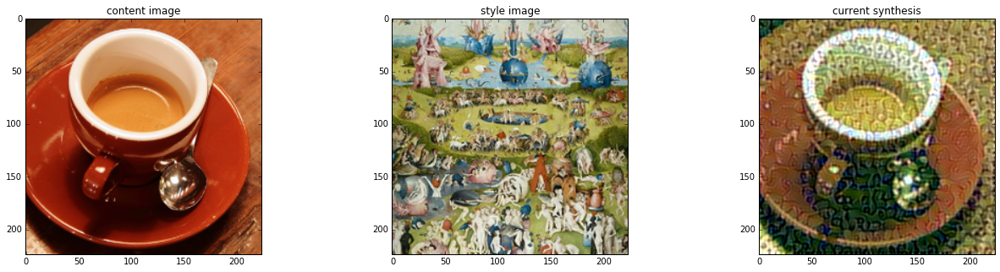

61: 9.940480, (-0.393409 - 1.389303)
62: 9.908276, (-0.392608 - 1.396200)
63: 9.877314, (-0.391608 - 1.402997)
64: 9.847815, (-0.390402 - 1.409703)
65: 9.819736, (-0.388995 - 1.416255)


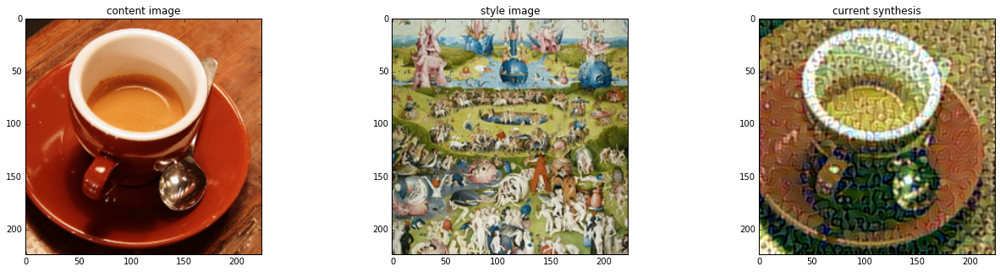

66: 9.792754, (-0.387381 - 1.422586)
67: 9.766596, (-0.385586 - 1.428678)
68: 9.741144, (-0.384339 - 1.434477)
69: 9.716408, (-0.396202 - 1.439959)
70: 9.692583, (-0.408149 - 1.445198)


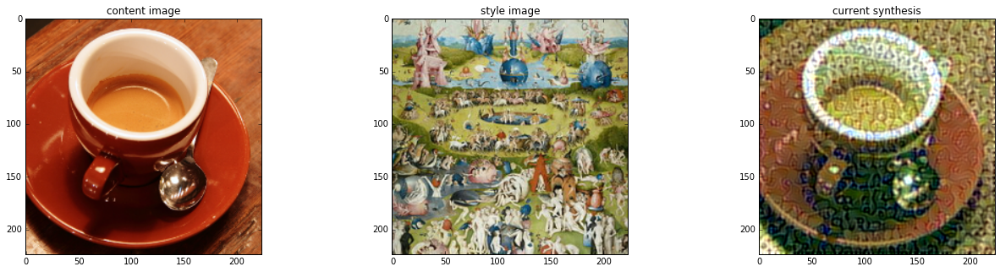

71: 9.669689, (-0.420201 - 1.450209)
72: 9.647569, (-0.432363 - 1.455014)
73: 9.626028, (-0.444627 - 1.459660)
74: 9.605102, (-0.456983 - 1.464140)
75: 9.584824, (-0.469422 - 1.468347)


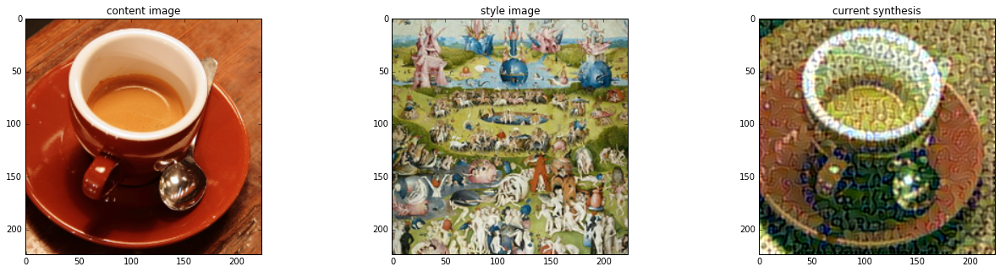

76: 9.565211, (-0.481931 - 1.472192)
77: 9.546281, (-0.494502 - 1.475690)
78: 9.527858, (-0.507132 - 1.478889)
79: 9.509901, (-0.519812 - 1.481811)
80: 9.492346, (-0.532554 - 1.484594)


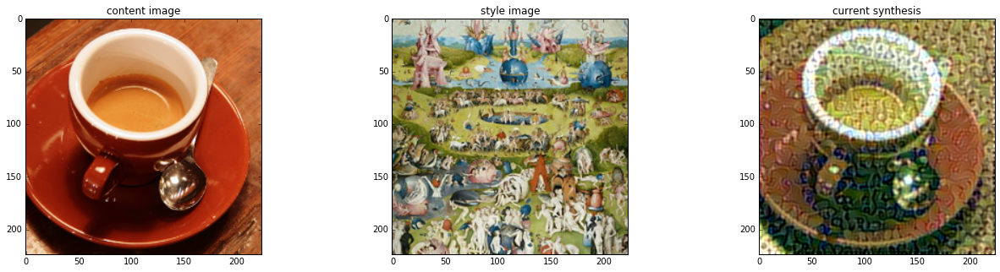

81: 9.475199, (-0.545363 - 1.487275)
82: 9.458512, (-0.558239 - 1.489857)
83: 9.442279, (-0.571179 - 1.492366)
84: 9.426536, (-0.584182 - 1.494845)
85: 9.411205, (-0.597234 - 1.497312)


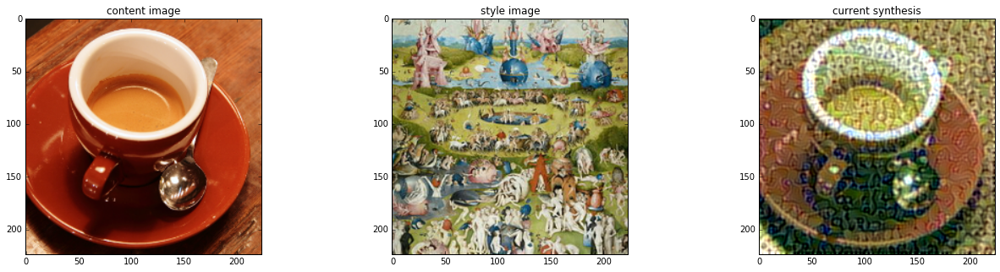

86: 9.396239, (-0.610334 - 1.501728)
87: 9.381626, (-0.623471 - 1.509634)
88: 9.367407, (-0.636638 - 1.517822)
89: 9.353575, (-0.649831 - 1.525973)
90: 9.340040, (-0.663042 - 1.533923)


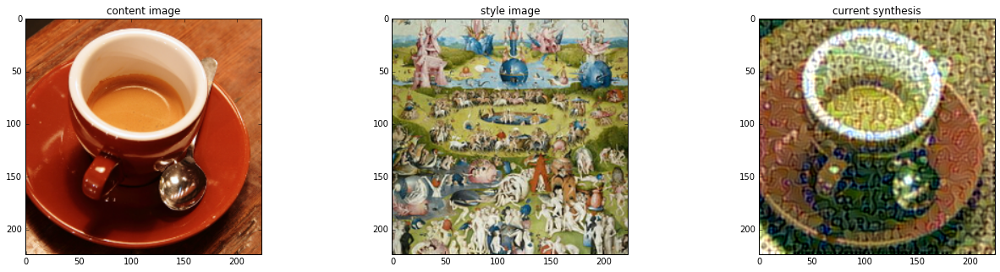

91: 9.326790, (-0.676278 - 1.541619)
92: 9.313822, (-0.689538 - 1.549024)
93: 9.301157, (-0.702835 - 1.556171)
94: 9.288795, (-0.716173 - 1.563234)
95: 9.276705, (-0.729558 - 1.570207)


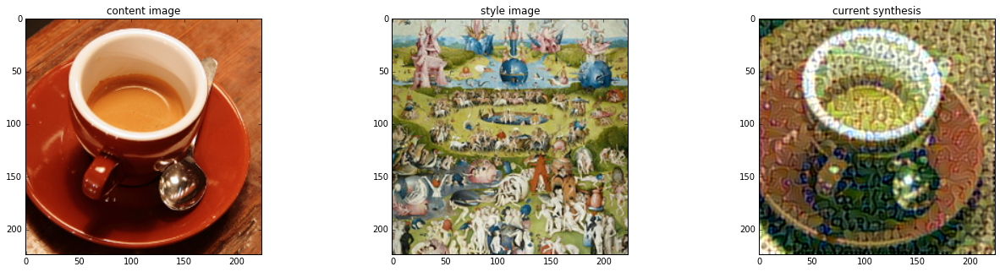

96: 9.264882, (-0.742992 - 1.577089)
97: 9.253311, (-0.756464 - 1.583826)
98: 9.241951, (-0.769972 - 1.590389)
99: 9.230789, (-0.783518 - 1.596775)


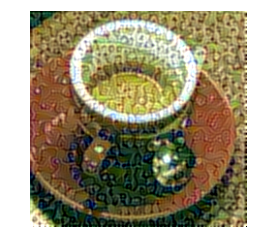

In [33]:
with tf.Session(graph=g) as sess, g.device('/cpu:0'):
    sess.run(tf.initialize_all_variables())
    # map input to noise
    n_iterations = 100
    og_img = net_input.eval()
    imgs = []
    for it_i in range(n_iterations):
        _, this_loss, synth = sess.run([optimizer, loss, net_input],
                feed_dict={
                    'vgg/dropout_1/random_uniform:0':
                        np.ones(g.get_tensor_by_name(
                        'vgg/dropout_1/random_uniform:0').get_shape().as_list()),
                    'vgg/dropout/random_uniform:0':
                        np.ones(g.get_tensor_by_name(
                        'vgg/dropout/random_uniform:0').get_shape().as_list())})
        print("%d: %f, (%f - %f)" %
            (it_i, this_loss, np.min(synth), np.max(synth)))
        if it_i % 5 == 0:
            imgs.append(np.clip(synth[0], 0, 1))
            fig, ax = plt.subplots(1, 3, figsize=(22, 5))
            ax[0].imshow(vgg16.deprocess(img))
            ax[0].set_title('content image')
            ax[1].imshow(vgg16.deprocess(style_img))
            ax[1].set_title('style image')
            ax[2].set_title('current synthesis')
            ax[2].imshow(vgg16.deprocess(synth[0]))
            plt.show()
            fig.canvas.draw()
    gif.build_gif(imgs, saveto='stylenet-bosch.gif')

In [34]:
ipyd.Image(url='stylenet-bosch.gif', height=300, width=300)

We can play with a lot of the parameters involved to produce wildly different results.  There are also a lot of extensions to what I've presented here currently in the literature including incorporating structure, temporal constraints, variational constraints, and other regularizing methods including making use of the activations in the content image to help infer what features in the gram matrix are relevant.

There is also no reason I can see why this approach wouldn't work with using different sets of layers or different networks entirely such as the Inception network we started with in this session.  Perhaps after exploring deep representations a bit more, you might find intuition towards which networks, layers, or neurons in particular represent the aspects of the style you want to bring out.  You might even try blending different sets of neurons to produce interesting results.  Play with different motions.  Try blending the results as you produce the deep dream with other content.

Also, there is no reason you have to start with an image of noise, or an image of the content.  Perhaps you can start with an entirely different image which tries to reflect the process you are interested in.  There are also a lot of interesting published extensions to this technique including image analogies, neural doodle, incorporating structure, and incorporating temporal losses from optical flow to stylize video.

There is certainly a lot of room to explore within technique.  A good starting place for the possibilities with the basic version of style net I've shown here is Kyle McDonald's Style Studies:

http://www.kylemcdonald.net/stylestudies/

If you find other interesting applications of the technique, feel free to post them on the forums.

<TODO: Neural Doodle, Semantic Style Transfer>

<a name="homework"></a>
# Homework

* GIF of deep dream
* GIF of stylenet
* Combine a Deep Dream and a Style Net together.

- Peer assessed
- Gallery commenting

<a name="reading"></a>
# Reading

Matthew D Zeiler, Rob Fergus.  Visualizing and Understanding Convolutional Networks.  2013.
https://arxiv.org/abs/1311.2901

Karen Simonyan, Andrea Vedaldi, Andrew Zisserman.  Deep Inside Convolutional Networks: Visualising Image Classification Models and Saliency Maps. 2013.

Aravindh Mahendran, Andrea Vedaldi.  Understanding Deep Image Representations by Inverting Them.  2014.
https://arxiv.org/abs/1412.0035

Mordvintsev, Alexander; Olah, Christopher; Tyka, Mike (2015). "Inceptionism: Going Deeper into Neural Networks". Google Research. Archived from the original on 2015-07-03.

Szegedy, Christian; Liu, Wei; Jia, Yangqing; Sermanet, Pierre; Reed, Scott; Anguelov, Dragomir; Erhan, Dumitru; Vanhoucke, Vincent; Rabinovich, Andrew (2014). "Going Deeper with Convolutions". Computing Research Repository. arXiv:1409.4842.

Leon A. Gatys, Alexander S. Ecker, Matthias Bethge. 
A Neural Algorithm of Artistic Style.  2015.  https://arxiv.org/abs/1508.06576

Texture Networks.
http://jmlr.org/proceedings/papers/v48/ulyanov16.pdf

Jost Tobias Springenberg, Alexey Dosovitskiy, Thomas Brox, Martin Riedmiller.  Striving for Simplicity: The All Convolutional Net.  2015.
https://arxiv.org/abs/1412.6806

Yosinski, J., Clune, J., Nguyen, A., Fuchs, T., Lipson, H.  Understanding Neural Networks Through Deep Visualization.  ICML.  2015.
http://yosinski.com/media/papers/Yosinski__2015__ICML_DL__Understanding_Neural_Networks_Through_Deep_Visualization__.pdf